In [1]:
!apt update && apt install ffmpeg libsm6 libxext6  -y
!pip install opencv-python

Get:1 http://security.debian.org/debian-security buster/updates InRelease [65.4 kB]
Get:2 http://deb.debian.org/debian buster InRelease [122 kB]
Get:3 http://deb.debian.org/debian buster-updates InRelease [51.9 kB]
Get:4 http://security.debian.org/debian-security buster/updates/main amd64 Packages [308 kB]
Get:5 http://deb.debian.org/debian buster/main amd64 Packages [7,906 kB]
Get:6 http://deb.debian.org/debian buster-updates/main amd64 Packages [15.2 kB]
Fetched 8,469 kB in 4s (2,402 kB/s)



2 packages can be upgraded. Run 'apt list --upgradable' to see them.



libsm6 is already the newest version (2:1.2.3-1).
libsm6 set to manually installed.
libxext6 is already the newest version (2:1.3.3-1+b2).
libxext6 set to manually installed.
The following additional packages will be installed:
  i965-va-driver intel-media-va-driver libaacs0 libaom0 libasound2
  libasound2-data libass9 libasyncns0 libavc1394-0 libavcodec58 libavdevice58
  libavfilter7 libavformat58 libavresample4 libavutil56

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import inspect
import math
from scipy.stats.distributions import chi2


In [ ]:
def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r,c,_ = img1.shape
    #img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    #img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,5)
        img1 = cv2.circle(img1,tuple(pt1),10,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),10,color,-1)
    return img1,img2
# Hot plot
def p(*argv, xlabel = '', ylabel = '', **kwargs):
    # This part gets the variabel names on the images from the variables given in the argumentts
    frame = inspect.currentframe()
    frame = inspect.getouterframes(frame)[1]
    string = inspect.getframeinfo(frame[0]).code_context[0].strip()
    args = string[string.find('(') + 1:-1].split(',')
    
    names = []
    searching = 0
    for i in args:
        if i.find('(') != -1:
            names.append(i.split('(')[1].strip())
            searching += 1
        
        if searching == 0:
            if i.find('=') != -1:
                names.append(i.split('=')[1].strip())
            else:
                names.append(i)
        
        if i.find(')') != -1:
            searching -= 1
    
    def get_axies(im):
        if type(im) is tuple:
            return im
        return (im, xlabel, ylabel)
    
    # This parts does the actual image rendering
    rows = math.ceil(len(argv)/4)
    figsize= kwargs['figsize'] if 'figsize' in kwargs.keys() else ((3.5*min(4, len(argv)),3.5*rows))
    fig,ax = plt.subplots(rows, min(4,len(argv)), figsize=figsize)
    fig.tight_layout()
    fig.subplots_adjust(wspace=.25, hspace=.25)
    for n, (i, im) in zip(names, enumerate(argv)):
        index = i%4 if rows <= 1 else (math.floor(i/4),i%4)
        a = ax if len(argv) == 1 else ax[index]
        (i, xl, yl) = get_axies(im)
        a.imshow(i, cmap='gray', **kwargs)
        a.set_title(n.replace('_', ' '))
        a.set_xlabel(xl)
        a.set_ylabel(yl)
        
    # Remove the excess axes
    excess = -4+len(argv)%4
    if rows > 1 and excess >= -3:
        for i in list(range(-1,excess-1,-1)):
            fig.delaxes(ax[-1][i])
            
    plt.show()



In [2]:
# Corrosponding coordinates

# im 174
imA = np.array([[367, 935], [132, 410], [887, 279], [1202, 112], [1027, 570], [522, 1466], [328, 1285], [1844,871], [2175, 745], [2012, 1374], [981, 1343], [710, 1396],[995,1378],[1086,1445],[1570,1290],[1852,976],[1870,1477],[1324,128],[2175,754],[2016,1397],[560,1175],[460,1365],[380,1272],[353,1102],[1770,1312]])
# im 175
imB = np.array([[379,977], [158, 410], [873, 449], [1186, 313], [1041, 715], [480, 1700], [170, 1556], [2026, 777], [2180, 750], [2100, 1498], [1017, 1565], [700, 1635],[1038,1569],[1168,1600],[1715,1316],[2006,856],[2014,1512],[995,675],[2177,755],[2090,1477],[555,1290],[399,1558],[271,1495],[293,1239],[1964,1250]])

print(len(imA))
print(len(imB))

25
25


In [3]:
im1 = plt.imread('I74.JPG')
im2 = plt.imread('I75.JPG')

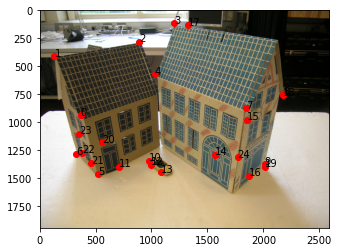

In [5]:
fig, ax = plt.subplots()
ax.imshow(im1)
ax.scatter(imA[:,0], imA[:,1],color='red')
for i, txt in enumerate(imA):
    ax.annotate(i, (imA[i,0], imA[i,1]))

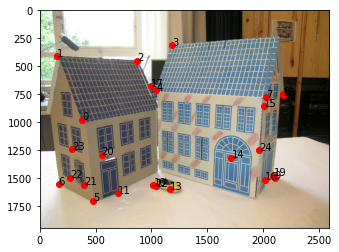

In [6]:
fig, ax = plt.subplots()
ax.imshow(im2)
ax.scatter(imB[:,0], imB[:,1],color='red')
for i, txt in enumerate(imB):
    ax.annotate(i, (imB[i,0], imB[i,1]))

In [4]:
#TA

meanAx = np.mean(imA[:,0])
meanAy = np.mean(imA[:,1])
meanA = np.array([meanAx,meanAy])
print(meanA)
stdAx = np.std(imA[:,0])
stdAy = np.std(imA[:,1])
stdA = np.array([stdAx,stdAy])
print(stdA)
T1 = np.array([[1/stdA[0],       0,0],
               [       0,1/stdA[1],0],
               [       0,        0,1]])

T2 = np.array([[1,0,-meanA[0]],
               [0,1,-meanA[1]],
               [0,0,       1]])

TA = T1@T2
# Translation matrix for ImB
meanBx = np.mean(imB[:,0])
meanBy = np.mean(imB[:,1])
meanB = np.array([meanBx,meanBy])

stdBx = np.std(imB[:,0])
stdBy = np.std(imB[:,1])
stdB = np.array([stdBx,stdBy])

T1 = np.array([[1/stdB[0],       0,0],
               [       0,1/stdB[1],0],
               [       0,        0,1]])

T2 = np.array([[1,0,-meanB[0]],
               [0,1,-meanB[1]],
               [0,0,       1]])

TB = T1@T2

[1143.92 1034.28]
[656.8505413  428.38417524]


In [5]:
imA3 = [np.append(np.array(x),1) for x in imA]
imB3 = [np.append(np.array(x),1) for x in imB]

normA = [TA@x for x in imA3]
normB = [TB@x for x in imB3]

In [6]:
A = np.array([[b[0]*a[0], b[0]*a[1], b[0], b[1]*a[0], b[1]*a[1], b[1], a[0], a[1], 1] for a,b in list(zip(normA,normB))])

In [ ]:
#b = A[:, 0].copy()
# we impose a condition that first term be 1, 
#x = np.linalg.lstsq(A[:, 1:], -b)[0]
#x = np.r_[1, x]
#x /= np.linalg.norm(x)
#x = x.reshape(3,3)

In [7]:
U,D,V = np.linalg.svd(A)
print(V.shape)
f = V.T[:,-1]
print(A@f)
f = f.reshape(3,3)
print(f)

(9, 9)
[-0.00537852  0.00293321 -0.00154586 -0.00128158  0.00419152  0.00359412
  0.00856316  0.03584527 -0.00624006  0.02427142  0.0152984   0.01216706
 -0.00628564 -0.01315666 -0.00588659 -0.01322322 -0.00702741 -0.00132017
 -0.01220005 -0.01760887 -0.01592394 -0.01177958  0.00203099  0.0027
  0.00711724]
[[ 0.05105751  0.0252593   0.64554435]
 [-0.03642637 -0.02005983  0.29397807]
 [-0.61509728 -0.33478323 -0.03808862]]


In [8]:
np.linalg.matrix_rank(f)
#np.linalg.matrix_rank(x)


3

In [8]:
U,D,V = np.linalg.svd(f)
D[-1] = 0
D = np.diag(D)
fRank2 = U@D@V
np.linalg.matrix_rank(fRank2)

2

In [13]:
print(fRank2)

[[ 0.05090969  0.02553085  0.64554526]
 [-0.03610579 -0.02064873  0.29397607]
 [-0.61512833 -0.33472619 -0.03808843]]


In [9]:
fdn = TB.T@fRank2@TA
print(fdn)

[[ 1.07948544e-07  8.30070051e-08  6.89766267e-04]
 [-1.26949615e-07 -1.11322006e-07  9.39301014e-04]
 [-9.14738503e-04 -7.48787700e-04 -4.58871455e-02]]


In [10]:
fdn/fdn[2,2]

array([[-2.35247896e-06, -1.80893808e-06, -1.50317972e-02],
       [ 2.76656161e-06,  2.42599545e-06, -2.04698070e-02],
       [ 1.99345262e-02,  1.63180274e-02,  1.00000000e+00]])

[367 935   1]
0.021657901483207027 0.01792245291519924 -23.655939143009203
[-9.15537589e-04 -7.57630158e-04  1.00000000e+00]


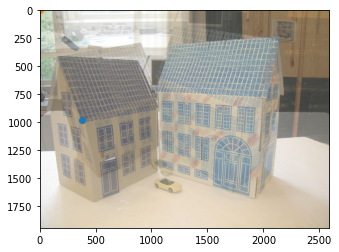

In [27]:
p2 = np.array(list(imA[0])+[1])
print(np.array(list(imA[0])+[1]))
p2 = (fdn/fdn[2,2]).T@p2
plt.figure()
plt.imshow(im1,alpha=0.5)
plt.imshow(im2,alpha=0.5)
plt.scatter(imB[0][0],imB[0][1])
print(p2[0],p2[1],p2[2])
print(p2/p2[2])
plt.scatter(p2[0],p2[1])

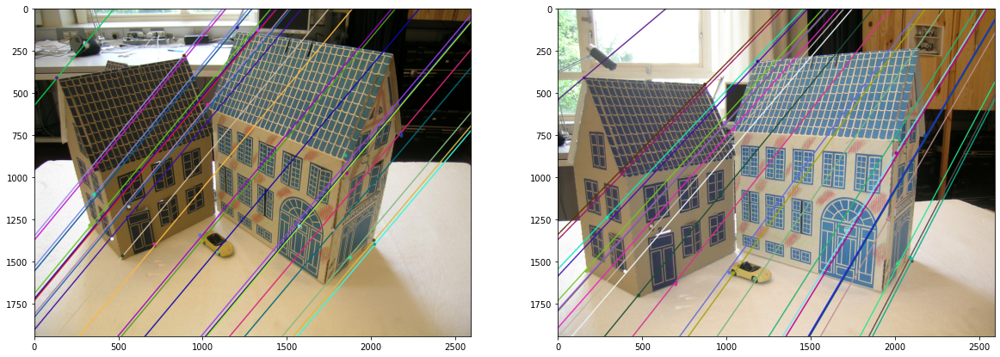

In [ ]:
# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv2.computeCorrespondEpilines(np.array(imB).reshape(-1,1,2), 2,f)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(im1,im2,lines1,imA,imB)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(np.array(imA).reshape(-1,1,2), 1,f)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(im2,im1,lines2,imB,imA)

fig,ax = plt.subplots(1,2,figsize=(20,24))
ax[0].imshow(img5)
ax[1].imshow(img3)
plt.show()

### Epipoles

In [ ]:
#A=USV.T and A.T=VSU.T

U,D,V = np.linalg.svd(f)
hp = V.T[:,-1]
rightEpi = [hp[0]/hp[2],hp[1]/hp[2]]
print(f'Left image epipole: {rightEpi}')
hp = U[:,-1]
leftEpi = [hp[0]/hp[2],hp[1]/hp[2]]
print(f'Right image epipole: {leftEpi}')

Left image epipole: [-104610.57557203583, 127733.71423073394]
Right image epipole: [4577.858789640893, -3312.8521913598393]


In [ ]:
U,D,V = np.linalg.svd(f)
hp = V.T[:,-1]
print(f@hp)

hp = U[:,-1]
print(hp@f)

[4.08752579e-21 1.01179932e-20 1.48064504e-17]
[ 4.41980373e-20  3.62648467e-20 -7.38764070e-18]


### Measure the orthogonal distance from epipolar line to points

In [ ]:
def lineErr(line, point):
    return np.abs(line@np.append(point, 1))/np.linalg.norm(line[:2])

## Rectification

In [ ]:
# Stereo rectification (uncalibrated variant)
# Adapted from: https://stackoverflow.com/a/62607343
h1, w1, _ = im1.shape
h2, w2, _ = im2.shape
_, H1, H2 = cv2.stereoRectifyUncalibrated(
    np.float32(imA), np.float32(imB), f, imgSize=(w1, h1)
)

In [ ]:
im1_rectified = cv2.warpPerspective(im1, H1, (w1, h1))
im2_rectified = cv2.warpPerspective(im2, H2, (w2, h2))

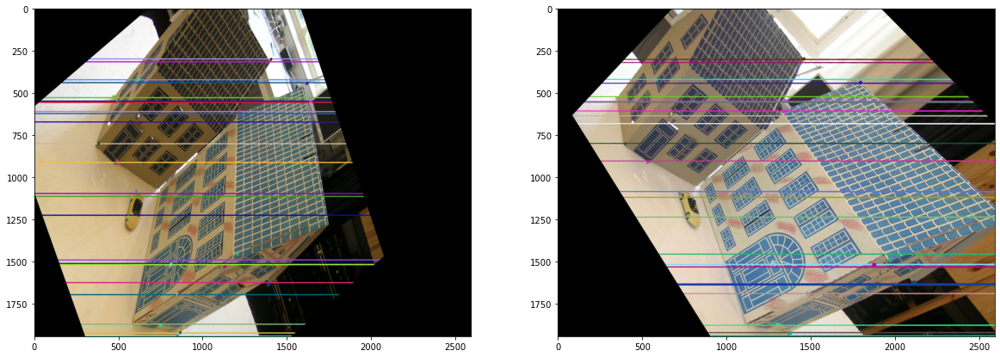

In [ ]:
fig,ax = plt.subplots(1,2,figsize=(20,24))
ax[0].imshow(im1_rectified)
ax[1].imshow(im2_rectified)

## Scanline Error

In [ ]:
def scanlineError(H1, H2, pts1, pts2):
    dists = []
    for pointA, pointB in zip(pts1,pts2):
        hoA = H1@pointA
        hoB = H2@pointB
        cA = hoA[1]/hoA[2]
        cB = hoB[1]/hoB[2]
        dists.append(abs(cA - cB))
    mean = np.mean(dists)
    std = np.sqrt(np.sum((dists - mean)**2)/len(dists))
    return mean, std

In [ ]:
m,s = scanlineError(H1,H2,imA3,imB3)
print(f'mean: {m}, std: {s}')

NameError: name 'scanlineError' is not defined

# Ransac

## Ransac Principle 

In [ ]:
def T(points):
    meanAx = np.mean(points[:,0])
    meanAy = np.mean(points[:,1])
    meanA = np.array([meanAx,meanAy])
    stdAx = np.std(points[:,0])
    stdAy = np.std(points[:,1])
    stdA = np.array([stdAx,stdAy])
    T1 = np.array([[1/stdA[0],       0,0],
                [       0,1/stdA[1],0],
                [       0,        0,1]])

    T2 = np.array([[1,0,-meanA[0]],
                [0,1,-meanA[1]],
                [0,0,       1]])

    return T1@T2

def fundamentalMat(pointsA, pointsB):
    TA = T(pointsA)
    TB = T(pointsB)

    imA3 = [np.append(np.array(x),1) for x in pointsA]
    imB3 = [np.append(np.array(x),1) for x in pointsB]

    normA = [TA@x for x in imA3]
    normB = [TB@x for x in imB3]

    A = np.array([[b[0]*a[0], b[0]*a[1], b[0], b[1]*a[0], b[1]*a[1], b[1], a[0], a[1], 1] for a,b in list(zip(normA,normB))])

    U,D,V = np.linalg.svd(A)
    f = V.T[:,-1]
    f = f.reshape(3,3)

    U,D,V = np.linalg.svd(f)
    D[-1] = 0
    D = np.diag(D)
    fRank2 = U@D@V
    return TB.T@fRank2@TA

def printPointsOnImage(im, points):
    points = np.array(points)
    fig, ax = plt.subplots()
    ax.imshow(im)
    ax.scatter(points[:,0], points[:,1])
    for i, txt in enumerate(points):
        ax.annotate(i, (points[i,0], points[i,1]))
    plt.show()

def get_err(a, b, f):
    a3 = [np.append(np.array(x),1) for x in a]
    b3 = [np.append(np.array(x),1) for x in b]
    h1, w1, _ = im1.shape
    h2, w2, _ = im2.shape
    try:
        _, H1, H2 = cv2.stereoRectifyUncalibrated(np.float32(a), np.float32(b), f, imgSize=(w1, h1))
        return scanlineError(H1,H2,a3,b3)
    except:
        return (np.inf, np.inf)
    

def ransac(pointsA, pointsB):
    bestErr = (np.inf, np.inf)
    totalInlisers = []
    inliers = []
    subset = 8
    sigma = .5
    threshold = 20 #sigma**2 * chi2.ppf(0.95, df=subset)
    N = 50000
    c = 0
    eps = 0.5
    #print('Threshold:', threshold, 'Number of potential combinations:', math.comb(len(pointsA), subset))
    
    while(c < N):
        i = np.random.choice(len(pointsA), subset, replace=False)
        mask = np.ones(len(pointsA), dtype=bool)
        mask[i] = False

        ins = []
        setA = pointsA[i]
        setB = pointsB[i]
        f = fundamentalMat(setA, setB)
        
        aP = np.float64([np.append(x,1) for x in pointsA[mask]])
        bP = np.float64([np.append(x,1) for x in pointsB[mask]])
        for a, oa, b, ob in zip(aP, pointsA[mask], bP, pointsB[mask]):
            if cv2.sampsonDistance(a,b,f) <= threshold:
                ins.append((oa,ob))
        
        if len(ins) > len(inliers):
            ins = np.array(ins)
            # err = get_err(ins[:,0],ins[:,1], f)
            # if err[0] < bestErr[0] and err[1] < bestErr[1]:
            #     bestErr = err
            inliers = ins
            totalInlisers = np.concatenate((inliers, list(zip(setA,setB))))
            print(get_err(totalInlisers[:,0],totalInlisers[:,1], f))

            eps = 1 - (len(totalInlisers) / (len(pointsA)))
            N = np.log10(1-0.99)/np.log10(1-(1-eps)**(subset))
            #print('eps', eps, 'N', N, 'inliers', len(totalInlisers))
        c += 1
    print(f'Number of inliers: {len(totalInlisers)}, {len(inliers)}, Iterations: {c}, Error: {bestErr}')
    return totalInlisers
    
    

#combi = ransac(imA, imB)


0
(1.2969796573700023, 1.4073797902062917)
(34.55641808295272, 71.94566890881916)
(6.756026005687981, 6.198599617051542)
(3.5362341218416886, 3.5483814680886114)
/tmp/ipykernel_1575/70302438.py:7: DeprecationWarning: This function is deprecated. Please call randint(1, 1944 + 1) instead
  set1 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
/tmp/ipykernel_1575/70302438.py:8: DeprecationWarning: This function is deprecated. Please call randint(1, 1944 + 1) instead
  set2 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
(2.868755150694401, 2.401385097163046)
Number of inliers: 16, 8, Iterations: 174, Error: (inf, inf)
(20.981321455247215, 43.09303835015087)
(3.992814997683915, 2.632638839571151)
(7.462121609468146, 6.6328606223196545)
(2.6748833729427437, 2.1182011147019124)
Number of inliers: 15, 7, Iterations: 272, Error: (inf, inf)
(60.41058895257584, 111.14833666572768)
(1.8813365702064897, 1.703011371464541)
(4.274224026543974, 4.459666471306641)
(5.205

Text(0, 0.5, 'Standard deviation')

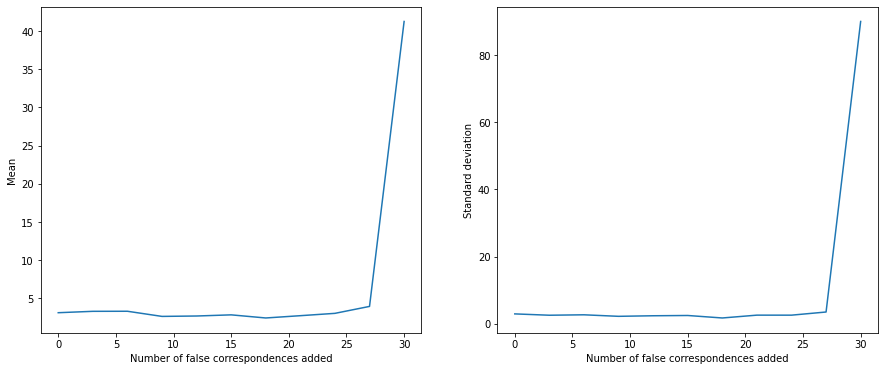

In [ ]:
means = []
stds = []
r = 33
for i in range(0,r,3):
    print(i)
    noisyCoords = i # Just random noise
    set1 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
    set2 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
    mTemp = []
    stdTemp = []
    for _ in range(10):
        combi = ransac(np.append(imA, set1, axis=0), np.append(imB, set2, axis=0))
        a = combi[:,0]
        b = combi[:,1]
        f = fundamentalMat(a, b)
        m,s = get_err(a,b,f)
        mTemp.append(m)
        stdTemp.append(s)
    print(np.median(mTemp))
    means.append(np.median(mTemp))
    stds.append(np.median(stdTemp))

print(means)
print(stds)
fig,ax = plt.subplots(1,2,figsize=(15,6))
ax[0].plot(np.arange(0,r,3),means)
ax[0].set_xlabel('Number of false correspondences added')
ax[0].set_ylabel('Mean')
ax[1].plot(np.arange(0,r,3),stds)
ax[1].set_xlabel('Number of false correspondences added')
ax[1].set_ylabel('Standard deviation')

In [ ]:
savedMeans = means
savedStds = stds
print(savedMeans)
print(savedStds)

[3.2496362315635436, 3.1630858282334144, 157.2188868629183, 9.382635587316598, inf, 3.6885374271331672, 5.955372376513628, 9.731697404713959, 532.661200757141, inf]
[2.652119451207385, 2.1438998220347223, 584.1009682613945, 16.999968516347558, inf, 3.466458830927008, 12.593592738237145, 16.362843361844384, 1380.037053726903, inf]


In [ ]:
newMeans = savedMeans
newMeans[8] = 180.12210869445272
newStds = savedStds
newStds[8] = 370.47733947202994

In [ ]:
print(newMeans)
print(newStds)

[3.2496362315635436, 3.1630858282334144, 8.180179636894072, 9.382635587316598, 35.07836361168246, 3.6885374271331672, 5.955372376513628, 9.731697404713959, 180.12210869445272, inf]
[2.652119451207385, 2.1438998220347223, 16.193462653694503, 16.999968516347558, 107.91035751951927, 3.466458830927008, 12.593592738237145, 16.362843361844384, 370.47733947202994, inf]


Text(0, 0.5, 'Standard deviation')

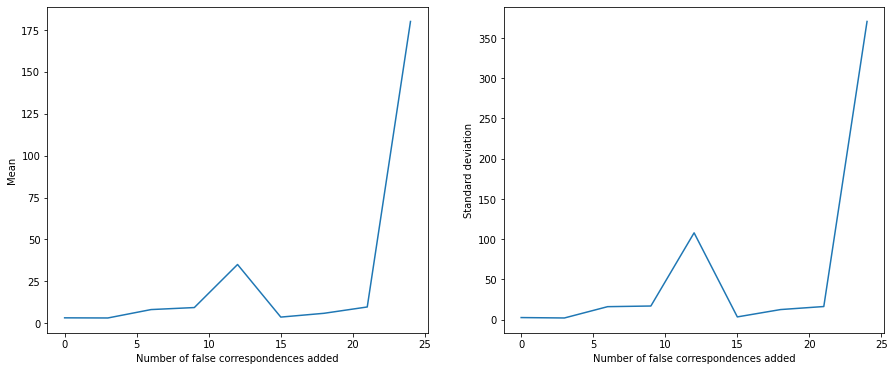

In [ ]:
fig,ax = plt.subplots(1,2,figsize=(15,6))
ax[0].plot(np.arange(0,27,3),newMeans[:-1])
ax[0].set_xlabel('Number of false correspondences added')
ax[0].set_ylabel('Mean')
ax[1].plot(np.arange(0,27,3),newStds[:-1])
ax[1].set_xlabel('Number of false correspondences added')
ax[1].set_ylabel('Standard deviation')

In [ ]:
np.median([2,3,1,5,4])

3.0

In [ ]:
savedMeans = means
savedStds = stds
print(savedMeans)
print(savedStds)

[3.1137256335100885, 3.2953090452643004, 3.3039018340475064, 2.6302280959529636, 2.682152272880166, 2.8328126637854414, 2.424081115241461, 2.7236761503113645, 3.029815247290667, 3.9383886831151, 41.26955779896457]
[2.9154364294217516, 2.517026342952254, 2.64505391406354, 2.191335749146347, 2.359765177899546, 2.440614775489667, 1.7000365720111799, 2.5429511296950413, 2.538239290028478, 3.476774658082677, 90.01583351939986]


Text(0, 0.5, 'Standard deviation')

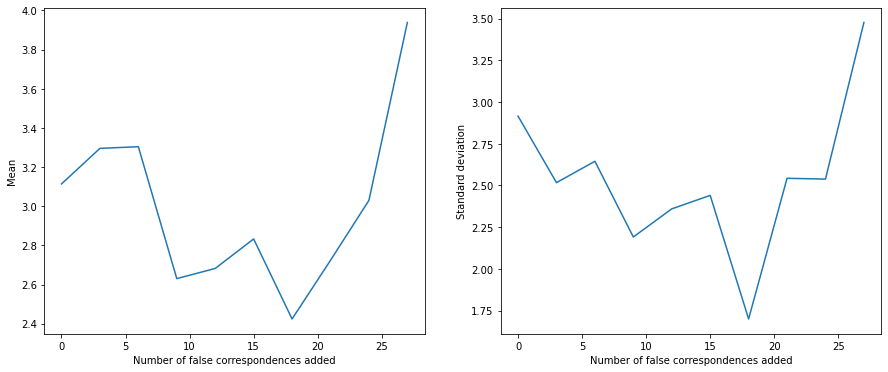

In [ ]:
fig,ax = plt.subplots(1,2,figsize=(15,6))
ax[0].plot(np.arange(0,30,3),means[:-1])
ax[0].set_xlabel('Number of false correspondences added')
ax[0].set_ylabel('Mean')
ax[1].plot(np.arange(0,30,3),stds[:-1])
ax[1].set_xlabel('Number of false correspondences added')
ax[1].set_ylabel('Standard deviation')

In [ ]:
some = {}

for coords in np.concatenate(lens):
    h = str(coords)
    if h in some.keys():
        some[h] += 1
    else:
        some[h] = 1

In [ ]:
some

{'[1027  570]': 6,
 '[ 981 1343]': 4,
 '[1870 1477]': 4,
 '[ 353 1102]': 6,
 '[1324  128]': 2,
 '[2012 1374]': 4,
 '[132 410]': 4,
 '[2175  745]': 7,
 '[1570 1290]': 5,
 '[1202  112]': 5,
 '[ 380 1272]': 7,
 '[ 522 1466]': 4,
 '[887 279]': 3,
 '[ 328 1285]': 5,
 '[ 710 1396]': 3,
 '[2175  754]': 5,
 '[ 560 1175]': 4,
 '[1770 1312]': 6,
 '[326 593]': 1,
 '[2016 1397]': 2,
 '[367 935]': 5,
 '[ 460 1365]': 3,
 '[1086 1445]': 3,
 '[1852  976]': 4,
 '[ 995 1378]': 2,
 '[1445  508]': 1}

In [ ]:
noisyCoords = 0 # Just random noise

set1 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
set2 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))

combi = ransac(np.append(imA, set1, axis=0), np.append(imB, set2, axis=0))


/tmp/ipykernel_67/3881238521.py:3: DeprecationWarning: This function is deprecated. Please call randint(1, 1944 + 1) instead
  set1 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
/tmp/ipykernel_67/3881238521.py:4: DeprecationWarning: This function is deprecated. Please call randint(1, 1944 + 1) instead
  set2 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
Threshold: 3.8768282639663627 Number of potential combinations: 536878650
/tmp/ipykernel_67/1330192649.py:6: RuntimeWarning: invalid value encountered in double_scalars
  cA = hoA[1]/hoA[2]
/tmp/ipykernel_67/1330192649.py:7: RuntimeWarning: invalid value encountered in double_scalars
  cB = hoB[1]/hoB[2]


KeyboardInterrupt: 

In [ ]:
combi = ransac(np.array(imA), np.array(imB))

(inf, inf)
(2941.6802276742983, 5964.374585167012)
(11.217935511244477, 10.332364315977303)
(3.63589570029514, 2.0963803622639876)
(4.271870844890655, 3.15324874388057)
(1.7548813704221176, 2.0523227222030482)
(3.23513350987812, 2.951325511414316)
Number of inliers: 17, 9, Iterations: 222, Error: (inf, inf)


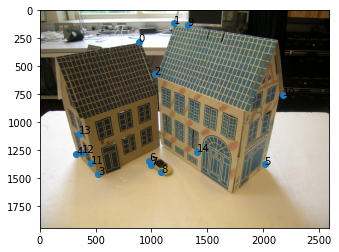

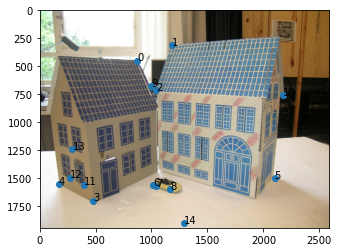

In [ ]:
printPointsOnImage(plt.imread('I74.JPG'), combi[:,0])
printPointsOnImage(plt.imread('I75.JPG'), combi[:,1])

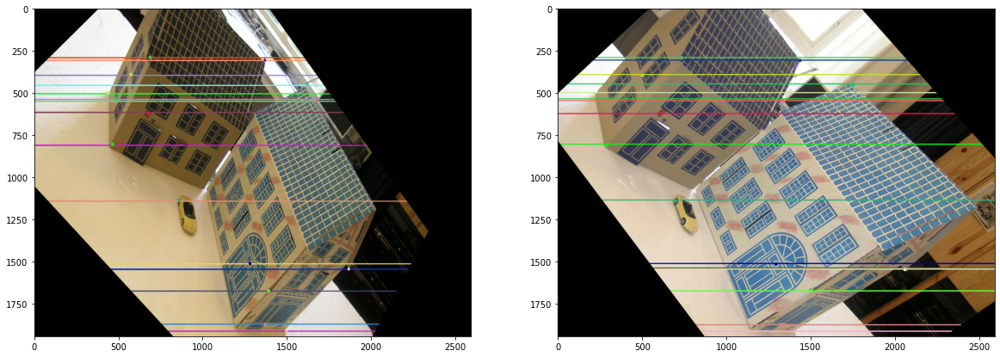

In [ ]:
a = combi[:,0]
b = combi[:,1]
f = fundamentalMat(a, b)

#imA3 = [np.append(np.array(x),1) for x in a]
#imB3 = [np.append(np.array(x),1) for x in b]

lines1 = cv2.computeCorrespondEpilines(np.array(b).reshape(-1,1,2), 2,f)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(im1,im2,lines1,a,b)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(np.array(a).reshape(-1,1,2), 1,f)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(im2,im1,lines2,b,a)

# Stereo rectification (uncalibrated variant)
# Adapted from: https://stackoverflow.com/a/62607343
h1, w1, _ = im1.shape
h2, w2, _ = im2.shape
_, H1, H2 = cv2.stereoRectifyUncalibrated(
    np.float32(a), np.float32(b), f, imgSize=(w1, h1)
)

im1_rectified = cv2.warpPerspective(im1, H1, (w1, h1))
im2_rectified = cv2.warpPerspective(im2, H2, (w2, h2))

fig,ax = plt.subplots(1,2,figsize=(20,24))
ax[0].imshow(im1_rectified)
ax[1].imshow(im2_rectified)

In [ ]:
imA3 = [np.append(np.array(x),1) for x in a]
imB3 = [np.append(np.array(x),1) for x in b]

In [ ]:
m,s = scanlineError(H1,H2,imA3,imB3)
print(m,s)

4.141533982570913 2.56724676831312


# Improved correspondences

In [ ]:
im1 = plt.imread('I74.JPG')
im2 = plt.imread('I75.JPG')

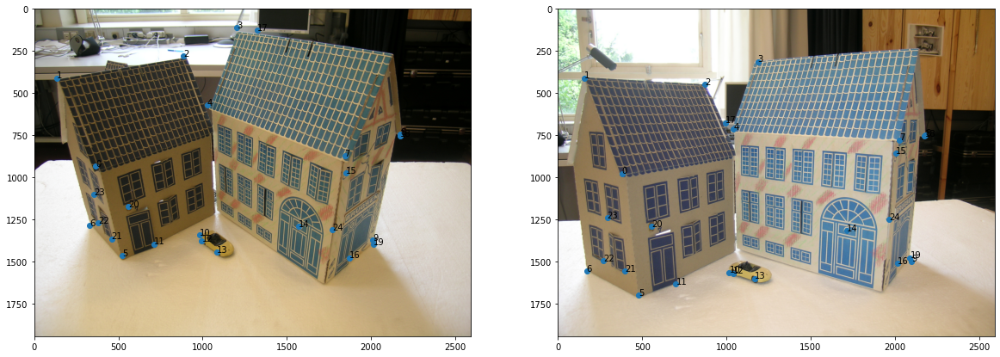

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(20,24))
ax[0].imshow(im1)
ax[0].scatter(imA[:,0], imA[:,1])
for i, txt in enumerate(imA):
    ax[0].annotate(i, (imA[i,0], imA[i,1]))

ax[1].imshow(im2)
ax[1].scatter(imB[:,0], imB[:,1])
for i, txt in enumerate(imB):
    ax[1].annotate(i, (imB[i,0], imB[i,1]))

In [ ]:
im1 = plt.imread('I74.JPG')
im2 = plt.imread('I75.JPG')

point = 25
cent = 3
blocksize = 50
crop = im1[imA[point,1]-blocksize:imA[point,1]+blocksize,imA[point,0]-blocksize:imA[point,0]+blocksize]
gray = cv2.cvtColor(crop,cv2.COLOR_BGR2GRAY)

dst = cv2.cornerHarris(gray,2,5,0.2)
dst = cv2.dilate(dst,None)
ret, dst = cv2.threshold(dst,0.01*dst.max(),255,0)
#crop[dst>0.01*dst.max()]=[0,0,255]
dst = np.uint8(dst)
ret, labels, stats, centroids = cv2.connectedComponentsWithStats(dst)

fig,ax = plt.subplots()
ax.imshow(crop)
ax.scatter(blocksize,blocksize)
ax.scatter(centroids[:,0],centroids[:,1])
ax.scatter(centroids[cent,0],centroids[cent,1])

IndexError: index 25 is out of bounds for axis 0 with size 25

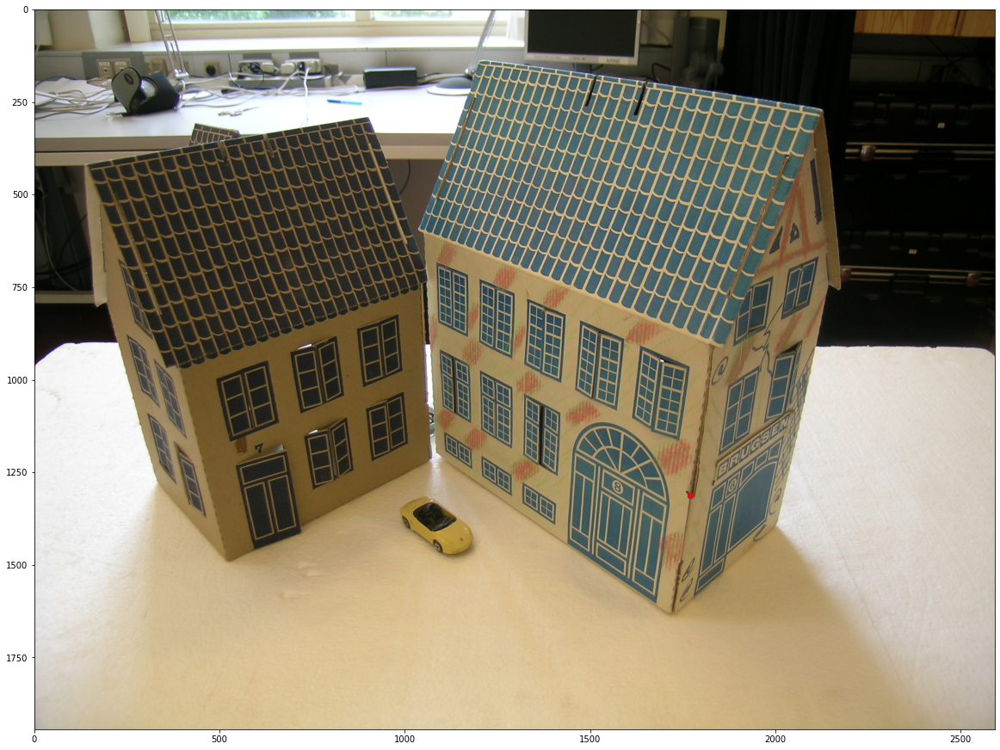

In [ ]:
g = (centroids[3] - [blocksize,blocksize]) + [imA[point,0],imA[point,1]] 
fig,ax = plt.subplots(figsize=(20,24))
ax.imshow(im1)
ax.scatter(g[0],g[1])
ax.scatter(imA[point,0],imA[point,1],c='red')

In [ ]:
g

array([1770.70833333, 1314.8125    ])

In [ ]:
imAI = np.array([[359,966],[143,417],[899,292],[1202,144],[1037,594],[524,1486],[332,1277],[1860,915],[2171,754],[2005,1384],[994,1368],[719,1405],[1003,1386],[1087,1451],[1574,1289],[1853,974],[1865,1471],[1334,115],[2144,745],[599,1187],[464,1372],[384,1282],[364,1099],[1770,1315]])
print(len(imAI))

24


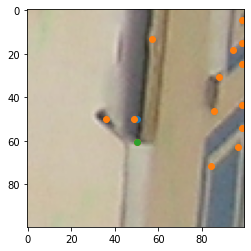

In [ ]:
im1 = plt.imread('I74.JPG')
im2 = plt.imread('I75.JPG')

point = 24
cent = 11
blocksize = 50
crop = im2[imB[point,1]-blocksize:imB[point,1]+blocksize,imB[point,0]-blocksize:imB[point,0]+blocksize]
gray = cv2.cvtColor(crop,cv2.COLOR_BGR2GRAY)

dst = cv2.cornerHarris(gray,2,5,0.01)
dst = cv2.dilate(dst,None)
ret, dst = cv2.threshold(dst,0.01*dst.max(),255,0)
#crop[dst>0.01*dst.max()]=[0,0,255]
dst = np.uint8(dst)
ret, labels, stats, centroids = cv2.connectedComponentsWithStats(dst)

fig,ax = plt.subplots()
ax.imshow(crop)
ax.scatter(blocksize,blocksize)
ax.scatter(centroids[:,0],centroids[:,1])
ax.scatter(centroids[cent,0],centroids[cent,1])

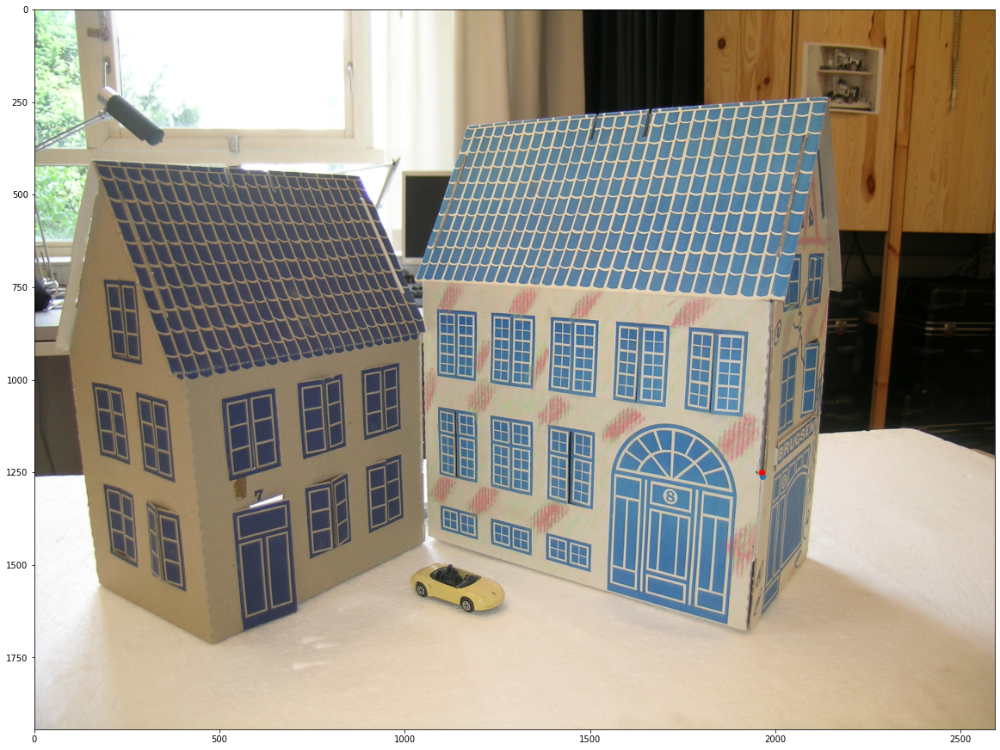

In [ ]:
g = (centroids[11] - [blocksize,blocksize]) + [imB[point,0],imB[point,1]] 
fig,ax = plt.subplots(figsize=(20,24))
ax.imshow(im2)
ax.scatter(g[0],g[1])
ax.scatter(imB[point,0],imB[point,1],c='red')

In [ ]:
g

array([1964.24528302, 1260.37735849])

In [ ]:
imBI = np.array([[370,989],[158,409],[873,448],[1169,321],[1029,731],[479,1709],[177,1552],[2023,786],[2176,760],[2085,1472],[1034,1545],[708,1624],[1043,1568],[1167,1610],[1716,1315],[2009,865],[2014,1511],[1004,667],[2148,759],[598,1314],[408,1570],[279,1506],[300,1234],[1964,1260]])
print(len(imBI))
imAI = np.array([[359,966],[143,417],[899,292],[1202,144],[1037,594],[524,1486],[332,1277],[1860,915],[2171,754],[2005,1384],[994,1368],[719,1405],[1003,1386],[1087,1451],[1574,1289],[1853,974],[1865,1471],[1334,115],[2144,745],[599,1187],[464,1372],[384,1282],[364,1099],[1770,1315]])
print(len(imAI))

24
24


### Only true correspondences error

In [ ]:
f = fundamentalMat(imAI,imBI)
imAI3 = [np.append(np.array(x),1) for x in imAI]
imBI3 = [np.append(np.array(x),1) for x in imBI]
h1, w1, _ = im1.shape
h2, w2, _ = im2.shape
_, H1, H2 = cv2.stereoRectifyUncalibrated(np.float32(imAI), np.float32(imBI), f, imgSize=(w1, h1))
m,s = scanlineError(H1,H2,imAI3,imBI3)
print(m,s)

1.9274619220325893 1.401577703027835


(1.6920972532860352, 1.5813451300557066)
(2.2875192620064153, 1.816311112019106)
Number of inliers: 22, 14, Iterations: 7, Error: (inf, inf)


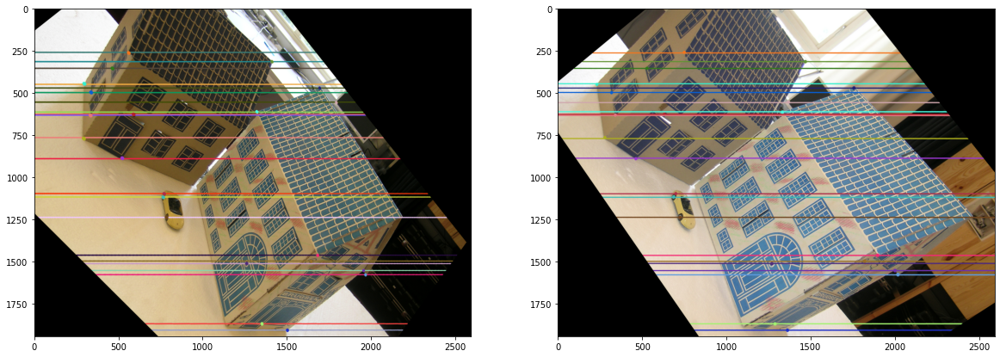

In [ ]:
combi = ransac(np.array(imAI), np.array(imBI))
a = combi[:,0]
b = combi[:,1]
f = fundamentalMat(a, b)

#imA3 = [np.append(np.array(x),1) for x in a]
#imB3 = [np.append(np.array(x),1) for x in b]

lines1 = cv2.computeCorrespondEpilines(np.array(b).reshape(-1,1,2), 2,f)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(im1,im2,lines1,a,b)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(np.array(a).reshape(-1,1,2), 1,f)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(im2,im1,lines2,b,a)

# Stereo rectification (uncalibrated variant)
# Adapted from: https://stackoverflow.com/a/62607343
h1, w1, _ = im1.shape
h2, w2, _ = im2.shape
_, H1, H2 = cv2.stereoRectifyUncalibrated(
    np.float32(a), np.float32(b), f, imgSize=(w1, h1)
)

im1_rectified = cv2.warpPerspective(im1, H1, (w1, h1))
im2_rectified = cv2.warpPerspective(im2, H2, (w2, h2))

fig,ax = plt.subplots(1,2,figsize=(20,24))
ax[0].imshow(im1_rectified)
ax[1].imshow(im2_rectified)

In [ ]:
imA3 = [np.append(np.array(x),1) for x in a]
imB3 = [np.append(np.array(x),1) for x in b]
m,s = scanlineError(H1,H2,imA3,imB3)
print(m,s)

1.5209237375424323 1.4099827132763363


### Noise

In [ ]:
noisyCoords = 25 # Just random noise

set1 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
set2 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))

a = np.append(imAI, set1, axis=0)
b = np.append(imBI, set2, axis=0)
f = fundamentalMat(a, b)

a3 = [np.append(np.array(x),1) for x in a]
b3 = [np.append(np.array(x),1) for x in b]
h1, w1, _ = im1.shape
h2, w2, _ = im2.shape
_, H1, H2 = cv2.stereoRectifyUncalibrated(np.float32(a), np.float32(b), f, imgSize=(w1, h1))
m,s = scanlineError(H1,H2,a3,b3)
print(m,s)

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: This function is deprecated. Please call randint(1, 1944 + 1) instead
  This is separate from the ipykernel package so we can avoid doing imports until
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:4: DeprecationWarning: This function is deprecated. Please call randint(1, 1944 + 1) instead
  after removing the cwd from sys.path.


error: OpenCV(4.5.3) /tmp/pip-req-build-l1r0y34w/opencv/modules/core/src/lapack.cpp:1244: error: (-5:Bad argument) The function can not solve under-determined linear systems in function 'solve'


### Ransac correspondences no noise

In [ ]:
combi = ransac(imAI,imBI)
print(combi.shape)

a = combi[:,0]
b = combi[:,1]
f = fundamentalMat(a, b)

a3 = [np.append(np.array(x),1) for x in a]
b3 = [np.append(np.array(x),1) for x in b]
h1, w1, _ = im1.shape
h2, w2, _ = im2.shape
_, H1, H2 = cv2.stereoRectifyUncalibrated(np.float32(a), np.float32(b), f, imgSize=(w1, h1))
m,s = scanlineError(H1,H2,a3,b3)
print(m,s)

threshold 62.0292522234618
0.0 5
(24, 2, 2)
1.9274619220224025 1.4015777030296235
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:77: RuntimeWarning: divide by zero encountered in log10


### Ransac Noise

In [ ]:
means = []
stds = []
r = 30
for i in range(27,r,3):
    print(i)
    noisyCoords = i # Just random noise
    set1 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
    set2 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
    mTemp = []
    stdTemp = []
    for _ in range(10):
        combi = ransac(np.append(imA, set1, axis=0), np.append(imB, set2, axis=0))
        a = combi[:,0]
        b = combi[:,1]
        f = fundamentalMat(a, b)
        m,s = get_err(a,b,f)
        mTemp.append(m)
        stdTemp.append(s)
    print(np.median(mTemp))
    means.append(np.median(mTemp))
    stds.append(np.median(stdTemp))

print(means)
print(stds)
# fig,ax = plt.subplots(1,2,figsize=(15,6))
# ax[0].plot(np.arange(0,r,3),means)
# ax[0].set_xlabel('Number of false correspondences added')
# ax[0].set_ylabel('Mean')
# ax[1].plot(np.arange(0,r,3),stds)
# ax[1].set_xlabel('Number of false correspondences added')
# ax[1].set_ylabel('Standard deviation')

27
(inf, inf)
(inf, inf)
/tmp/ipykernel_1575/261170015.py:7: DeprecationWarning: This function is deprecated. Please call randint(1, 1944 + 1) instead
  set1 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
/tmp/ipykernel_1575/261170015.py:8: DeprecationWarning: This function is deprecated. Please call randint(1, 1944 + 1) instead
  set2 = np.random.random_integers(im1.shape[0], size=(noisyCoords,2))
(133.57972380331728, 279.0869704506838)
(9.099340825258222, 8.596684872341601)
(5.4444154409725645, 6.135402849187992)
(2.5306003541776447, 2.2544675038216146)
(4.746230980889568, 4.066447931003698)
Number of inliers: 16, 8, Iterations: 57319, Error: (inf, inf)
(inf, inf)
(inf, inf)
(70.66395845510094, 125.38254327993674)
(79.90987597103498, 143.15646806284718)
(31.866952264883814, 57.46995478001365)
(3.446307386846492, 2.877325177279197)
(4.352099494535915, 4.796761105253741)
Number of inliers: 16, 8, Iterations: 57319, Error: (inf, inf)
(56.92640649125865, 113.590760182770

In [ ]:
savedMeans = newMeans
savedStds = newStds
print(savedMeans)
print(savedStds)

[2.3045613636019286, 2.3656634932511142, 2.8232891242728, 2.4508607864221084, 2.6587248339177574, 2.1915603259535237, 3.553581243692097, 3.1618997013235637, 6.0184438391078885, 2.852696384615216]
[1.8131614864405665, 1.9827284422965614, 2.319178588192501, 1.907664636086102, 2.090646854478594, 2.1536515011868733, 3.0739963108448896, 2.316404870352424, 7.358081285280288, 1.952327463174166]


In [ ]:
newMeans = [2.3045613636019286, 2.3656634932511142, 2.8232891242728, 2.4508607864221084, 2.6587248339177574, 2.1915603259535237, 3.553581243692097, 3.1618997013235637, 6.0184438391078885, 2.852696384615216]
newStds = [1.8131614864405665, 1.9827284422965614, 2.319178588192501, 1.907664636086102, 2.090646854478594, 2.1536515011868733, 3.0739963108448896, 2.316404870352424, 7.358081285280288, 1.952327463174166]
newMeans[9] = 5.266657573089777
newStds[9] = 4.372980316772691

In [ ]:
print(newMeans)
print(newStds)

[2.3045613636019286, 2.3656634932511142, 2.8232891242728, 2.4508607864221084, 2.6587248339177574, 2.1915603259535237, 3.553581243692097, 3.1618997013235637, 6.0184438391078885, 5.266657573089777]
[1.8131614864405665, 1.9827284422965614, 2.319178588192501, 1.907664636086102, 2.090646854478594, 2.1536515011868733, 3.0739963108448896, 2.316404870352424, 7.358081285280288, 4.372980316772691]


Text(0, 0.5, 'Standard deviation')

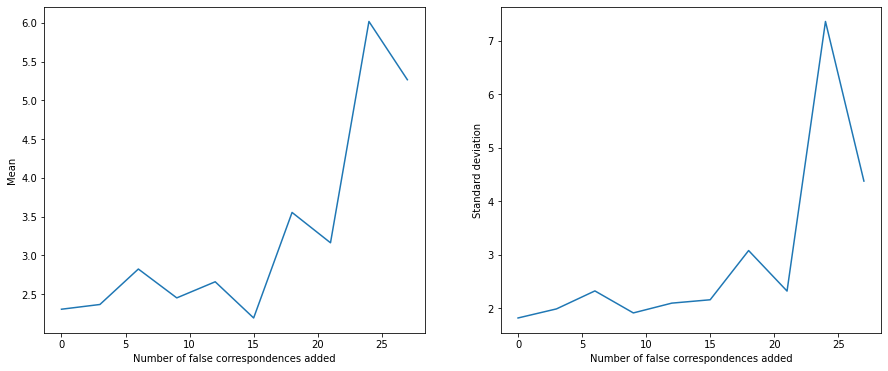

In [ ]:
fig,ax = plt.subplots(1,2,figsize=(15,6))
ax[0].plot(np.arange(0,30,3),newMeans)
ax[0].set_xlabel('Number of false correspondences added')
ax[0].set_ylabel('Mean')
ax[1].plot(np.arange(0,30,3),newStds)
ax[1].set_xlabel('Number of false correspondences added')
ax[1].set_ylabel('Standard deviation')

# Library solution

In [ ]:
im1 = plt.imread('I74.JPG')
im2 = plt.imread('I75.JPG')

In [ ]:
sift = cv2.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(im1,None)
kp2, des2 = sift.detectAndCompute(im2,None)
# FLANN parameters
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1,des2,k=2)
pts1 = []
pts2 = []
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.8*n.distance:
        pts2.append(kp2[m.trainIdx].pt)
        pts1.append(kp1[m.queryIdx].pt)

In [ ]:
pts1 = pts1[::25]
pts2 = pts2[::25]
print(len(pts1))
pts1 = np.int32(pts1)
pts2 = np.int32(pts2)
F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)
# We select only inlier points
pts1 = pts1[mask.ravel()==1]
pts2 = pts2[mask.ravel()==1]

87


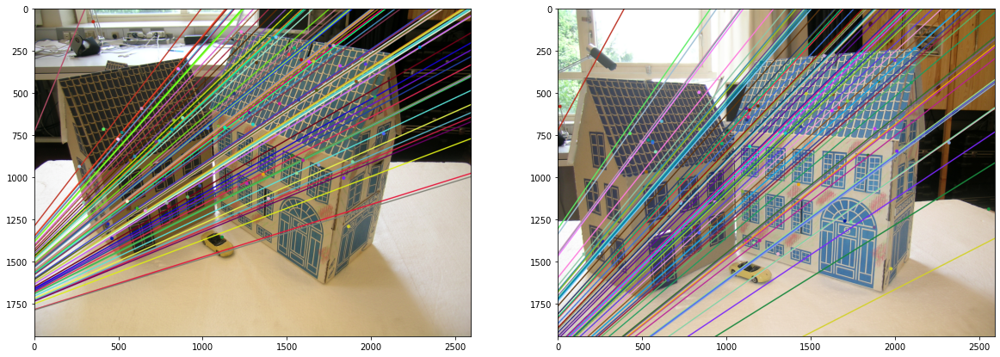

In [ ]:
# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1,1,2), 2,F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(im1,im2,lines1,pts1,pts2)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 1,F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(im2,im1,lines2,pts2,pts1)

fig,ax = plt.subplots(1,2,figsize=(20,24))
ax[0].imshow(img5)
ax[1].imshow(img3)
plt.show()

In [ ]:
# Stereo rectification (uncalibrated variant)
# Adapted from: https://stackoverflow.com/a/62607343
h1, w1, _ = im1.shape
h2, w2, _ = im2.shape
_, H1, H2 = cv2.stereoRectifyUncalibrated(
    np.float32(imA), np.float32(imB), F, imgSize=(w1, h1)
)

In [ ]:
im1_rectified = cv2.warpPerspective(im1, H1, (w1, h1))
im2_rectified = cv2.warpPerspective(im2, H2, (w2, h2))

(-0.5, 2591.5, 1943.5, -0.5)

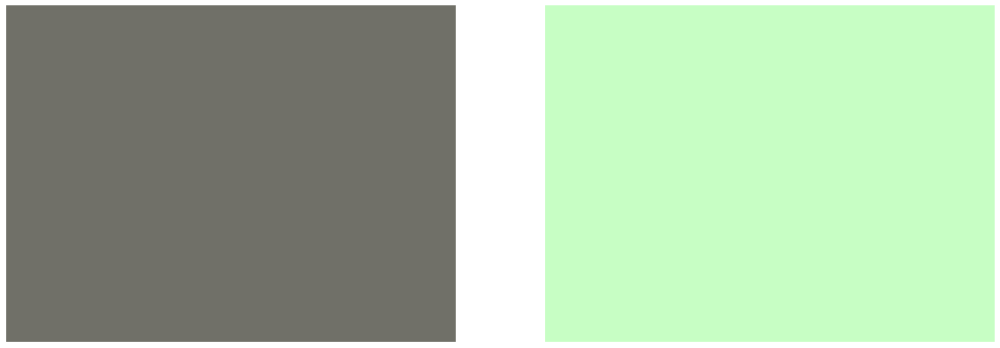

In [ ]:
fig,ax = plt.subplots(1,2,figsize=(20,24))
ax[0].imshow(im1_rectified)
ax[1].imshow(im2_rectified)
ax[0].axis('off')
ax[1].axis('off')

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=715a1e20-cf88-4392-be19-7391a8dd0abf' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>